# Algoritmos de densidad

## Tarea 4.1

*Realiza el pre-procesamiento necesario para poder aplicar algoritmos de densidad.*

Creemos que no es necesario aplicar más preprocesamiento que para las otras partes de esta tarea.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn import metrics
from scipy.spatial.distance import mahalanobis
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering, Birch, KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import silhouette_score, calinski_harabasz_score, silhouette_samples, davies_bouldin_score
from sklearn.cluster import DBSCAN
import plotly.express as px
from sklearn.neighbors import NearestNeighbors

In [3]:
scaled_df = pd.read_csv('scaled_df.csv')
normalized_df = pd.read_csv('normalized_df.csv')
grouped_df = pd.read_csv('df_grouped.csv')

Al principio, resolvimos esta tarea utilizando los datos normalizados, ya que son más recomendables para los algoritmos de densidad. Sin embargo, tras utilizar el mismo código para los datos normalizados, decidimos utilizar estos últimos, ya que dan resultados ligeramente mejores que los normalizados.

## Tarea 4.2

*Establece el radio (eps) y número de puntos mínimo número más adecuado de clusters para el dataset proporcionado.*

In [4]:
# para facilitar y no cambiar todos los nombres
normalized_df = scaled_df

En primer lugar, trazamos la distancia a los vecinos más próximos, para establecer el valor de épsilon. Vamos a utilizar 60 vecinos más cercanos, ya que es el doble del número de características que tenemos en nuestro marco de datos.

In [4]:
neighbors = NearestNeighbors(n_neighbors=60) # usamos 60 vicinos = 2*30 features
neighbors_fit = neighbors.fit(normalized_df)
distances, indices = neighbors_fit.kneighbors(normalized_df)

In [5]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]

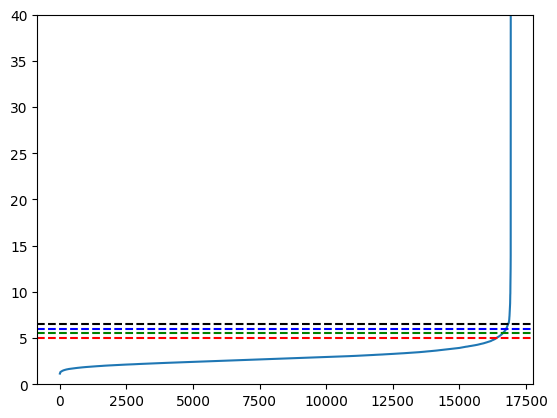

In [81]:
plt.plot(distances)
plt.axhline(y=5, color='r', linestyle='--')
plt.axhline(y=5.5, color='g', linestyle='--')
plt.axhline(y=6, color='b', linestyle='--')
plt.axhline(y=6.5, color='k', linestyle='--')
plt.ylim(0, 40)
plt.show()

Podemos ver en el gráfico que lo mejor sería utilizar 5 como valor épsilon, aunque también podemos probar con otros que están marcados en el gráfico.

Como MinPts podemos probar dos métodos recomendados - 2*dimention o dimention + 1. Para ambos usaremos el primer epsilon elegido de valor 0.5.

### MinPts = 2*dimention

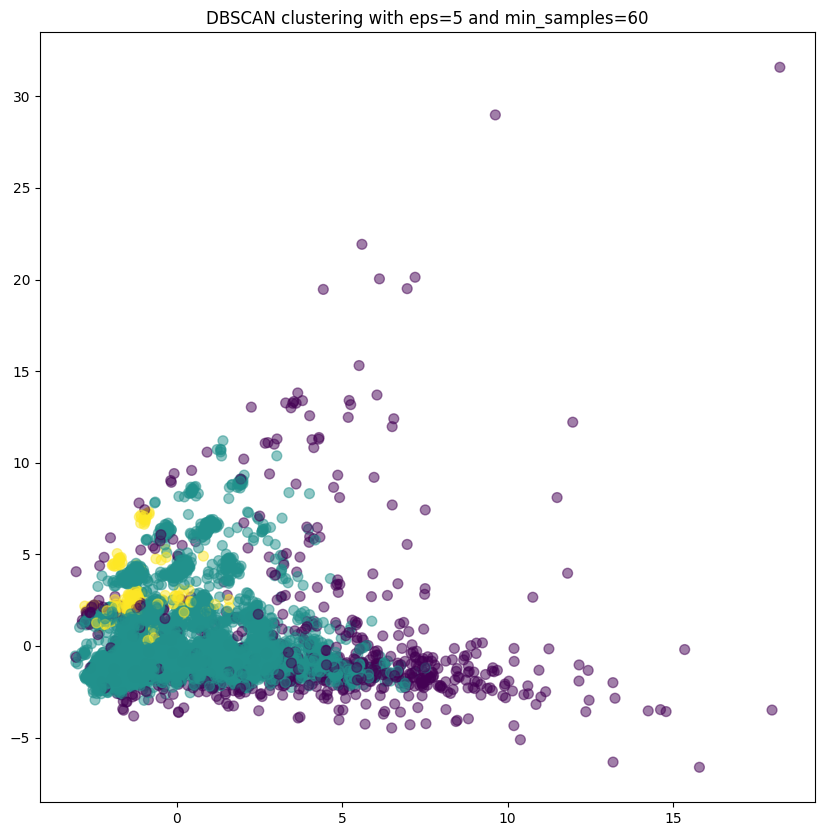

In [22]:
dbscan = DBSCAN(eps=5, min_samples=60)
dbscan.fit(normalized_df)
labels = dbscan.labels_

pca = PCA(n_components=2)

reduced_data = pca.fit_transform(normalized_df)

plt.figure(figsize=(10, 10))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, s=50, alpha=0.5)
plt.title('DBSCAN clustering with eps=5 and min_samples=60')
plt.show()

Calculamos la puntuación de la silueta para evaluar los resultados.

In [85]:
silhouette_score(normalized_df, labels)

0.22419456779779082

### MinPts = dimention+1

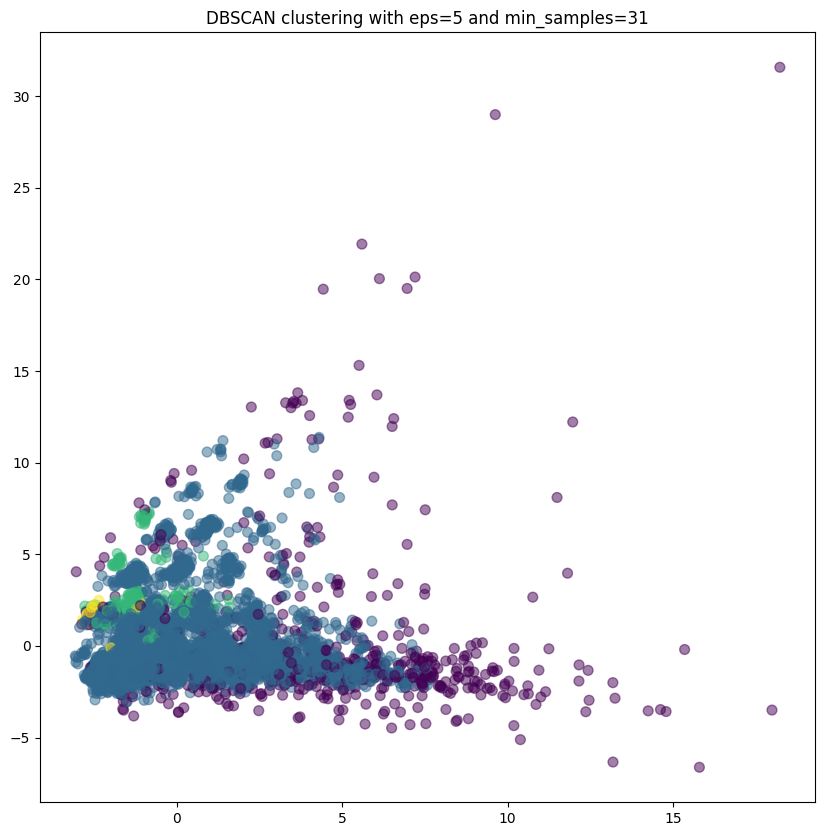

In [23]:
dbscan = DBSCAN(eps=5, min_samples=31)
dbscan.fit(normalized_df)
labels = dbscan.labels_

pca = PCA(n_components=2)

reduced_data = pca.fit_transform(normalized_df)

plt.figure(figsize=(10, 10))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, s=50, alpha=0.5)
plt.title('DBSCAN clustering with eps=5 and min_samples=31')
plt.show()

In [83]:
silhouette_score(normalized_df, labels)

0.22703736583726764

Podemos ver que la primera da una puntuación de siluetas más baja y un menor número de conglomerados (3), mientras que la segunda da una puntuación de siluetas más alta y un mayor número de conglomerados (4). 

Para obtener el mejor resultado, analizaremos varias configuraciones de eps y MinPts. Las evaluaremos utilizando el índice de Davies-Bouldin, ya que es el recomendado para los algoritmos de densidad. 

## Tarea 4.3

*¿Cómo varía la calidad del clustering con diferentes valores de 'eps' y de minpoints?*

Definimos la función que nos ayudará a trazar y evaluar los resultados.

In [16]:
def evaluate_clustering_with_dbscan_and_quality_index(data, eps_range=np.arange(0.1, 2.0, 0.1), min_samples_range=range(2, 10), quality_index='davis_bouldin'):
    """
    Evalúa la calidad del clustering DBSCAN para diferentes valores de eps y min_samples utilizando índices de calidad seleccionados.
    
    Parámetros:
        - data: Dataset a clusterizar (array-like).
        - quality_index: Índice de calidad ('davis_bouldin').
        - eps_range: Rango de valores para el parámetro eps (default: np.arange(0.1, 2.0, 0.1)).
        - min_samples_range: Rango de valores para el parámetro min_samples (default: range(2, 10)).
    """
    valid_indices = ['davis_bouldin']
    if quality_index not in valid_indices:
        raise ValueError(f"Índice de calidad no válido. Elija entre {valid_indices}.")
    
    davis_bouldin_scores = []

    num_combinations = len(eps_range) * len(min_samples_range)
    
    num_columns = 3  
    num_rows = int(np.ceil(num_combinations / num_columns))  
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))  
    axes = axes.flatten()  
    plot_index = 0  
    for eps in eps_range:
        for min_samples in min_samples_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)

            if len(set(labels)) > 1:
                try:
                    score = davies_bouldin_score(data, labels)
                except ValueError:
                    score = np.nan  
            else:
                score = np.nan  
            davis_bouldin_scores.append(score)

            pca = PCA(n_components=2)
            data_2D = pca.fit_transform(data)

            sns.scatterplot(
                x=data_2D[:, 0], y=data_2D[:, 1], hue=labels, 
                palette=sns.color_palette("tab10", len(set(labels))), ax=axes[plot_index], s=50, legend=None
            )
            axes[plot_index].set_title(f"Eps={eps:.2f}, MinPts={min_samples} - DBI: {score:.4f}")
            axes[plot_index].set_xlabel('Componente Principal 1')
            axes[plot_index].set_ylabel('Componente Principal 2')

            plot_index += 1

    plt.tight_layout()
    plt.show()

### Epsilon = 5

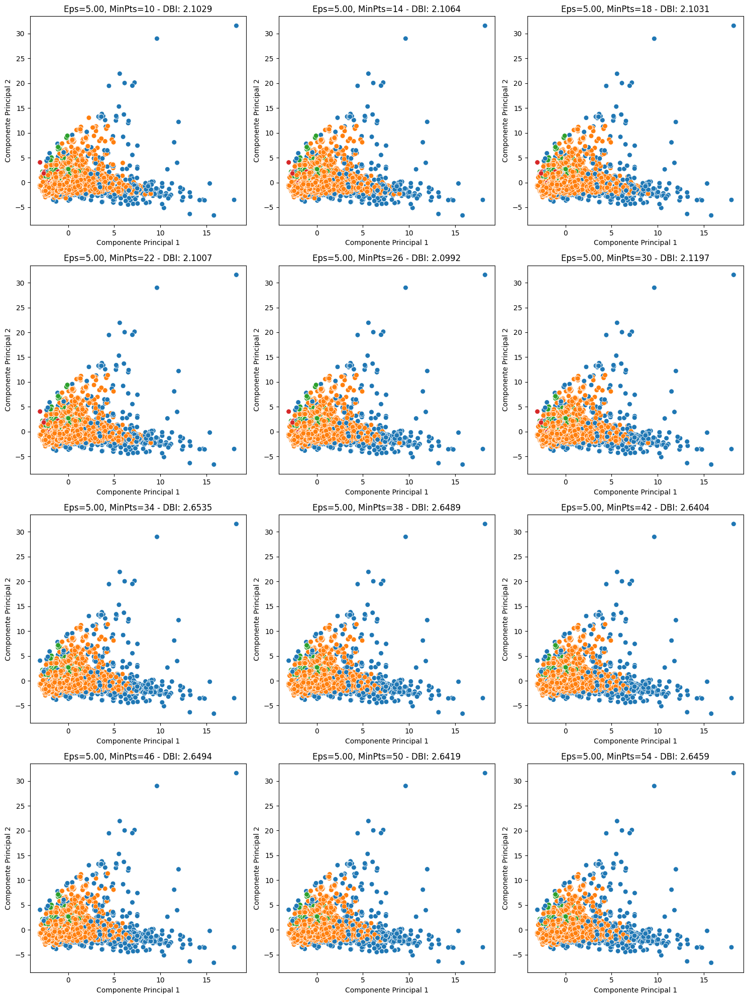

In [45]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[5], min_samples_range=range(10, 58, 4), quality_index='davis_bouldin')

A continuación visulizamos los resultados para la gama de mejores puntuaciones obtenidas en el código anterior.

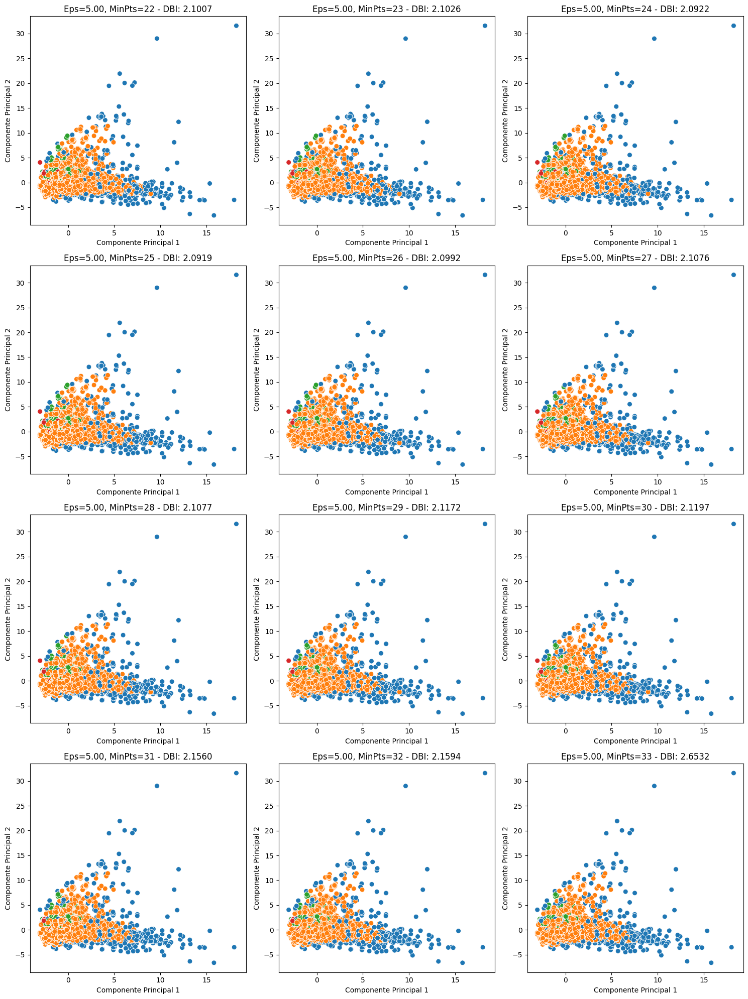

In [47]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[5], min_samples_range=range(22, 34), quality_index='davis_bouldin')

### Epsilon = 5.5

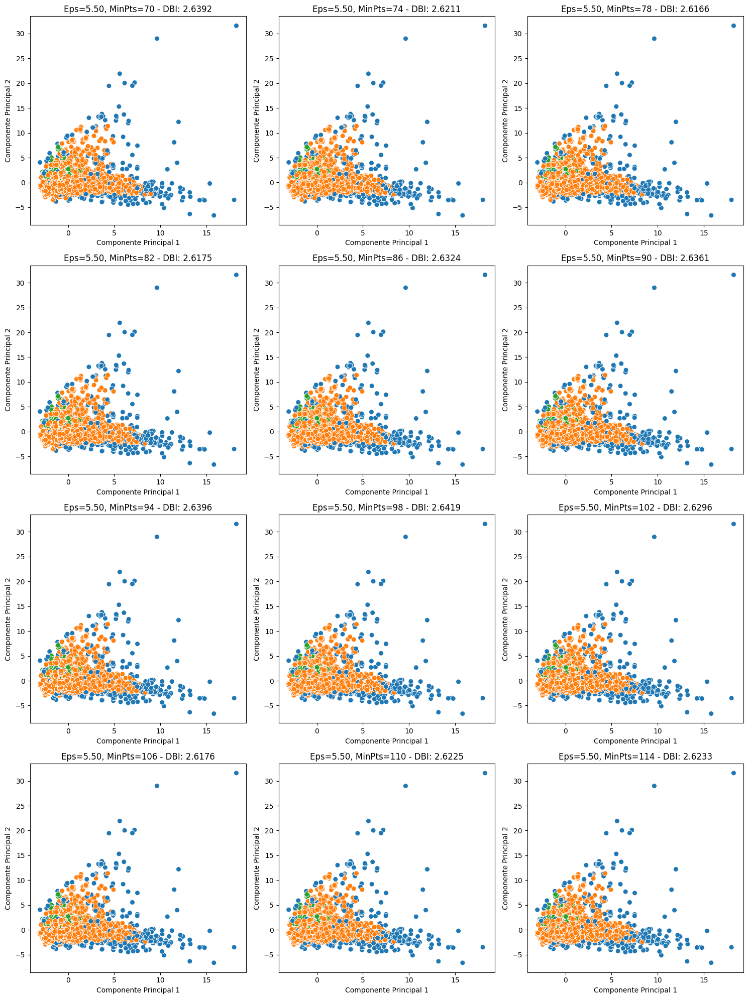

In [18]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[5.5], min_samples_range=range(70, 118, 4), quality_index='davis_bouldin')

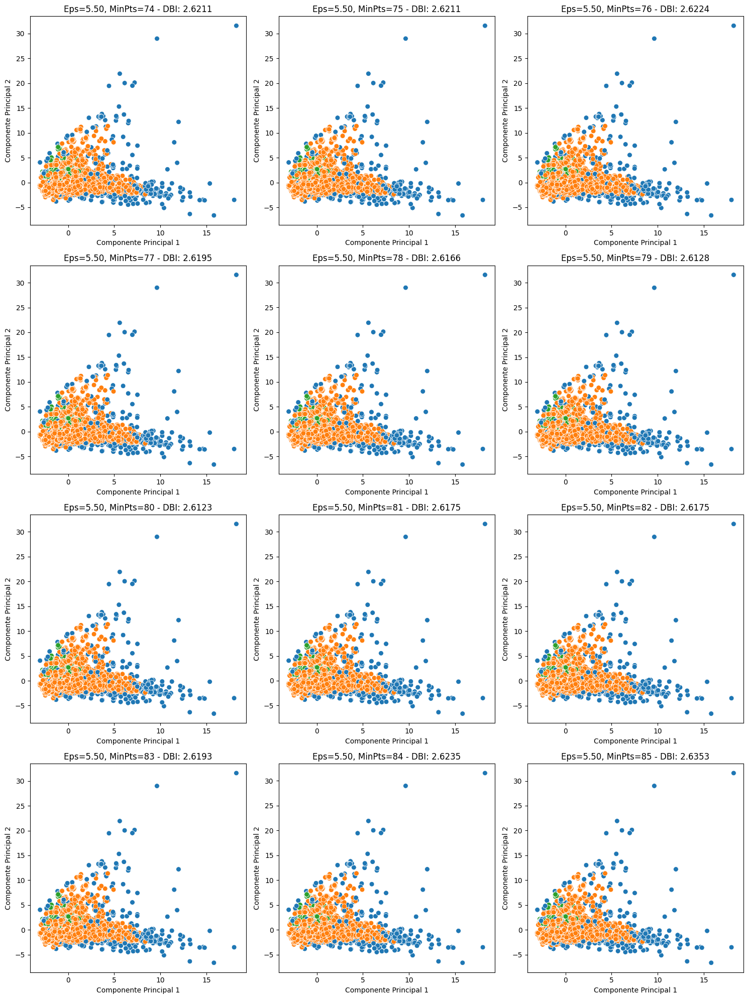

In [48]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[5.5], min_samples_range=range(74, 86), quality_index='davis_bouldin')

### Epsilon = 6

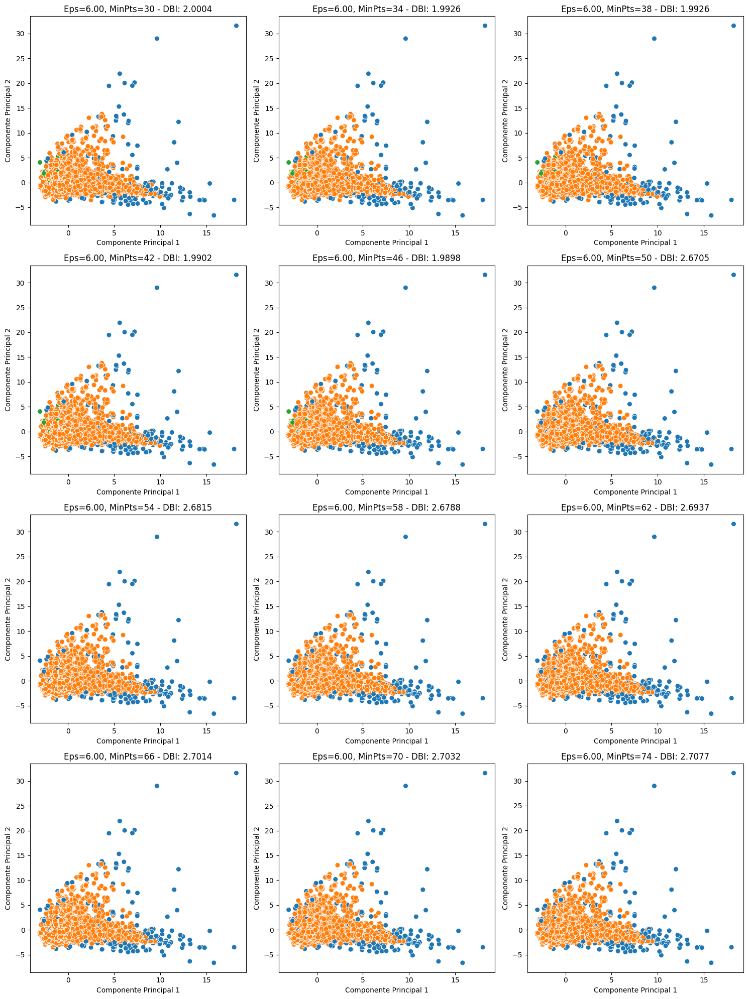

In [19]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[6], min_samples_range=range(30, 78, 4), quality_index='davis_bouldin')

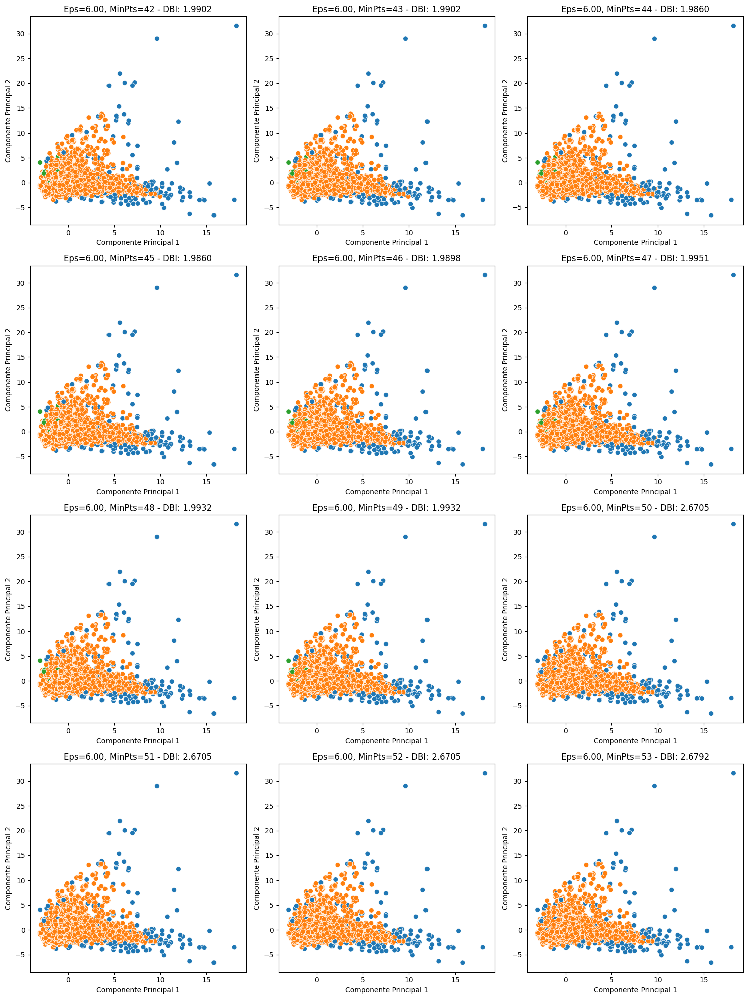

In [49]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[6], min_samples_range=range(42, 54), quality_index='davis_bouldin')

### Epsilon = 6.5

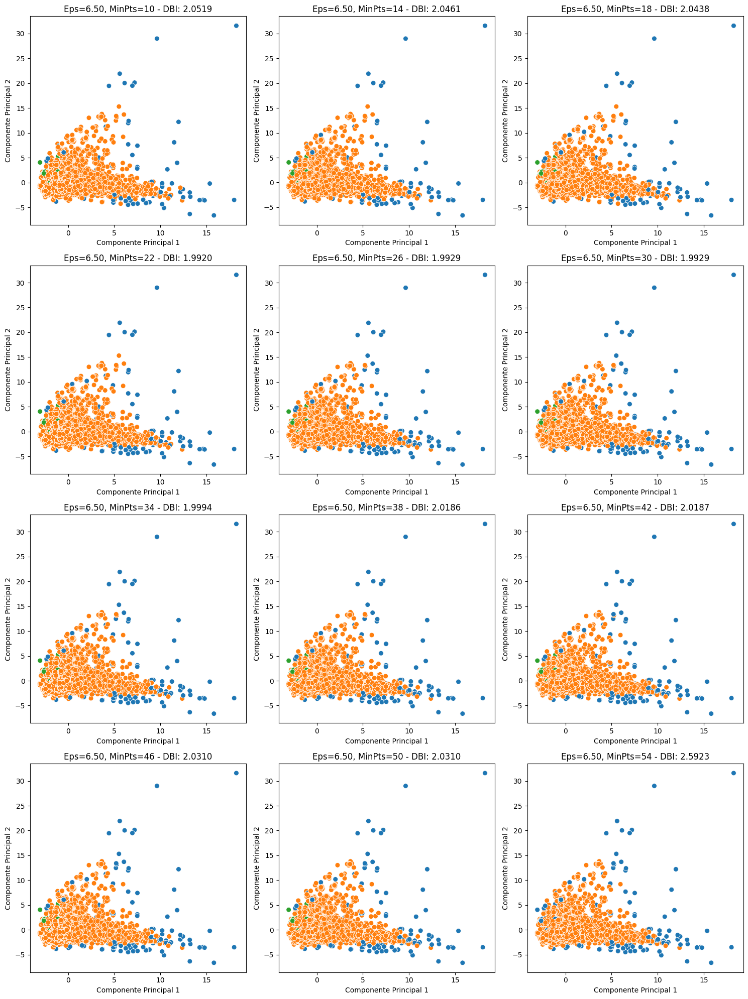

In [20]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[6.5], min_samples_range=range(10, 58, 4), quality_index='davis_bouldin')

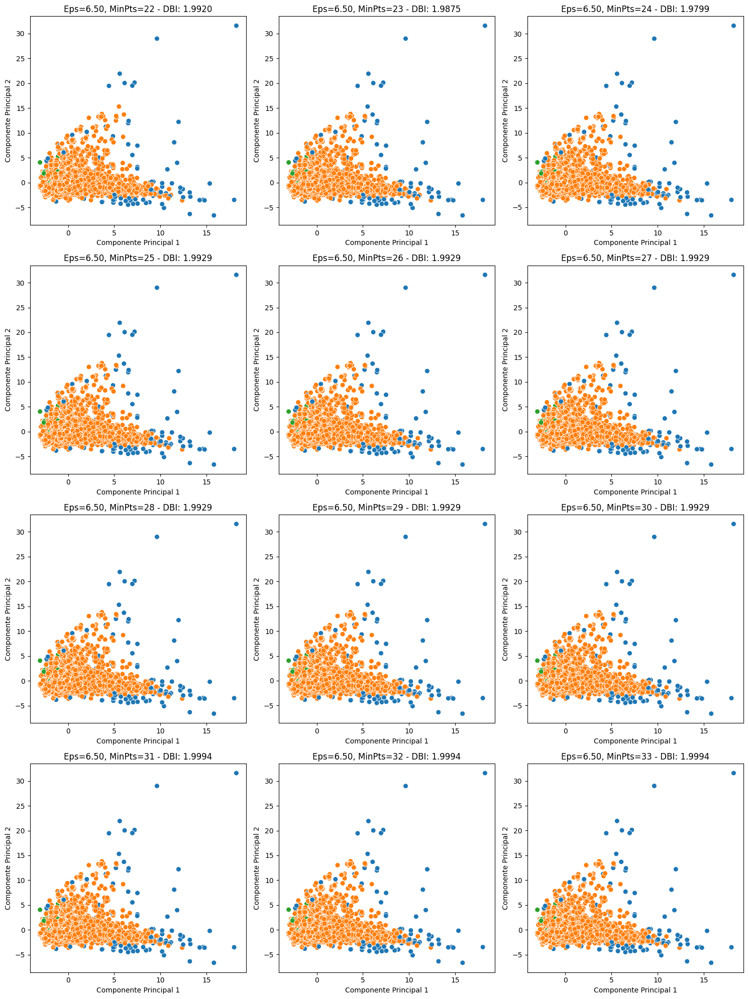

In [50]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[6.5], min_samples_range=range(22, 34), quality_index='davis_bouldin')

### Epsilon = 7

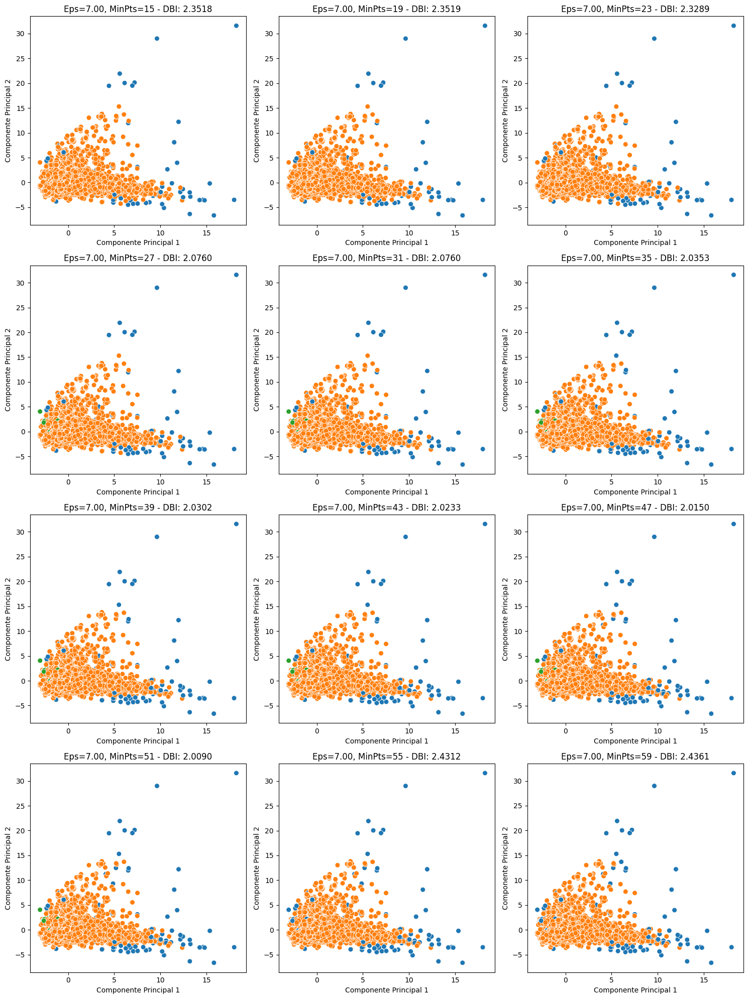

In [21]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[7], min_samples_range=range(15, 63, 4), quality_index='davis_bouldin')

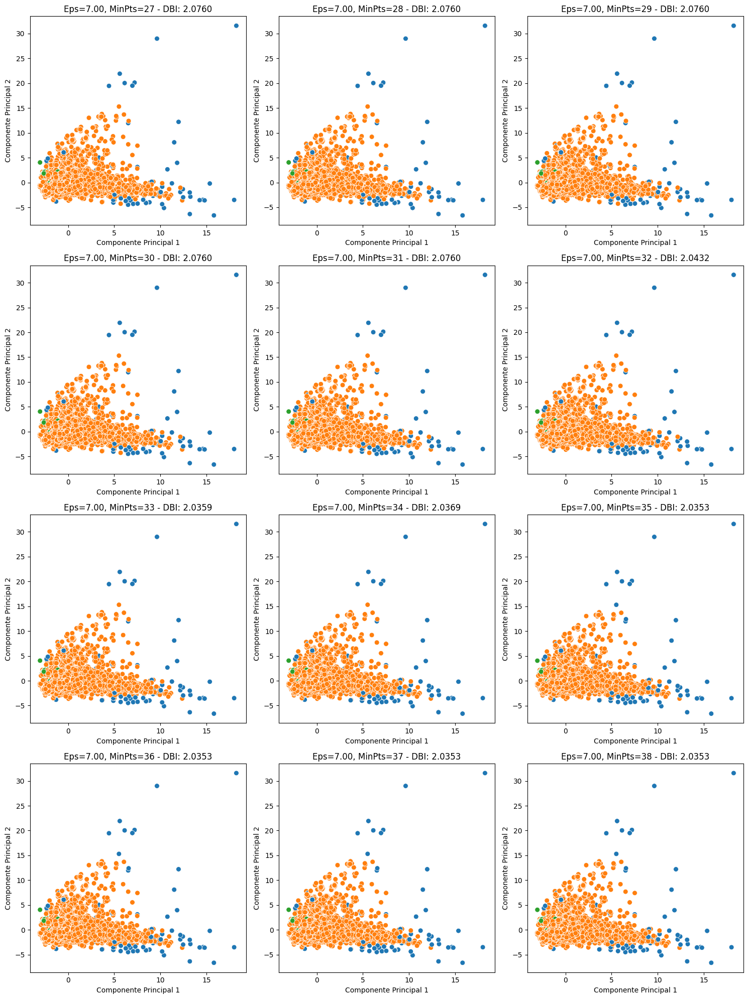

In [51]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[7], min_samples_range=range(27, 39), quality_index='davis_bouldin')

### Epsilon = 7.5

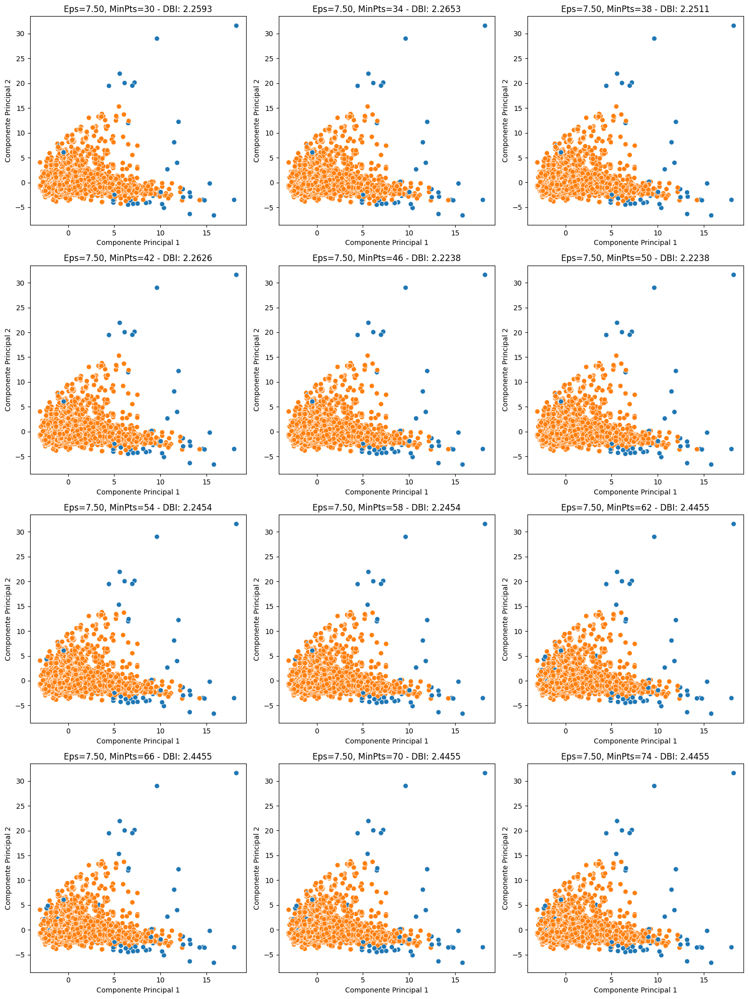

In [22]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[7.5], min_samples_range=range(30, 78, 4), quality_index='davis_bouldin')

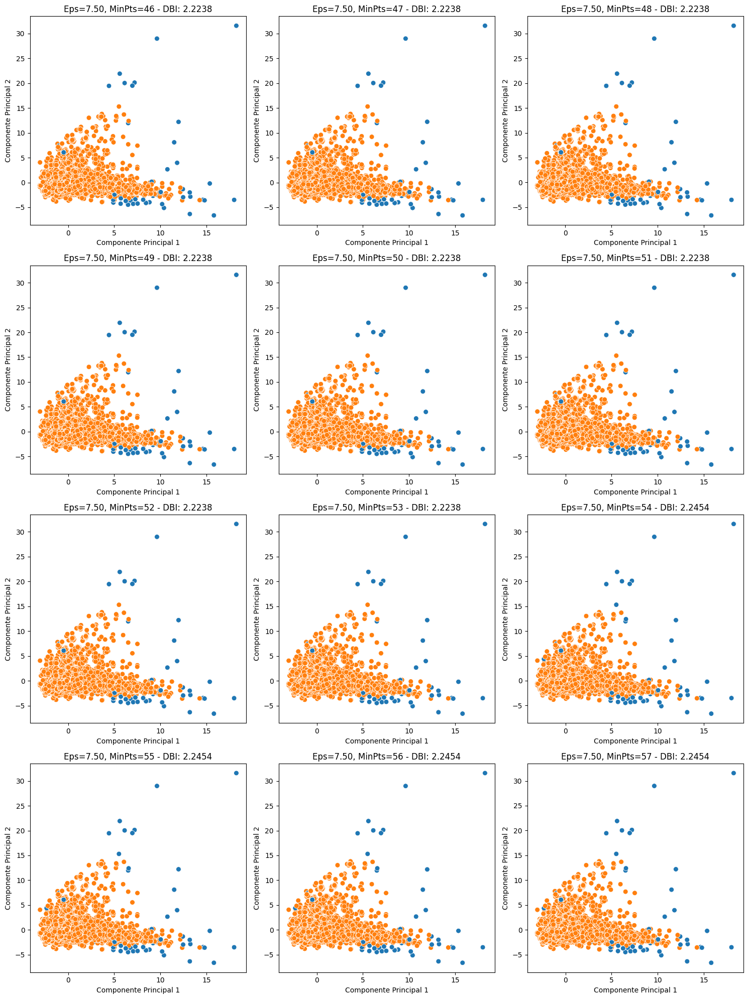

In [52]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[7.5], min_samples_range=range(46, 58), quality_index='davis_bouldin')

## Tarea 4.4

*Utiliza por lo menos dos índices de calidad de clustering y analiza sus resultados.*

Tras analizar los resultados de la tarea 4.3, elegimos el mejor resultado para cada épsilon y lo evaluamos utilizando la puntuación de silueta, la puntuación calinski-harabasz y la puntuación davies-bouldin. 

Definimos una función para facilitar el proceso.

In [6]:
def analyse_results():
    print(f"Silhouette Coefficient: {metrics.silhouette_score(normalized_df, labels):.3f}")
    print(f"Calinski-Harabasz Index: {metrics.calinski_harabasz_score(normalized_df, labels):.3f}")
    print(f"Davies-Bouldin Index: {metrics.davies_bouldin_score(normalized_df, labels):.3f}")

In [118]:
normalized_df.shape

(16929, 30)

### Epsilon = 5

En primer lugar, perfeccionamos DBSCAN para obtener el número estimado de clusters y el número de puntos de ruido.

In [70]:
db = DBSCAN(eps=5, min_samples=25).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 3
Estimated number of noise points: 485


A continuación, visualizamos los resultados.

Primero, con el ruido representado en negro.

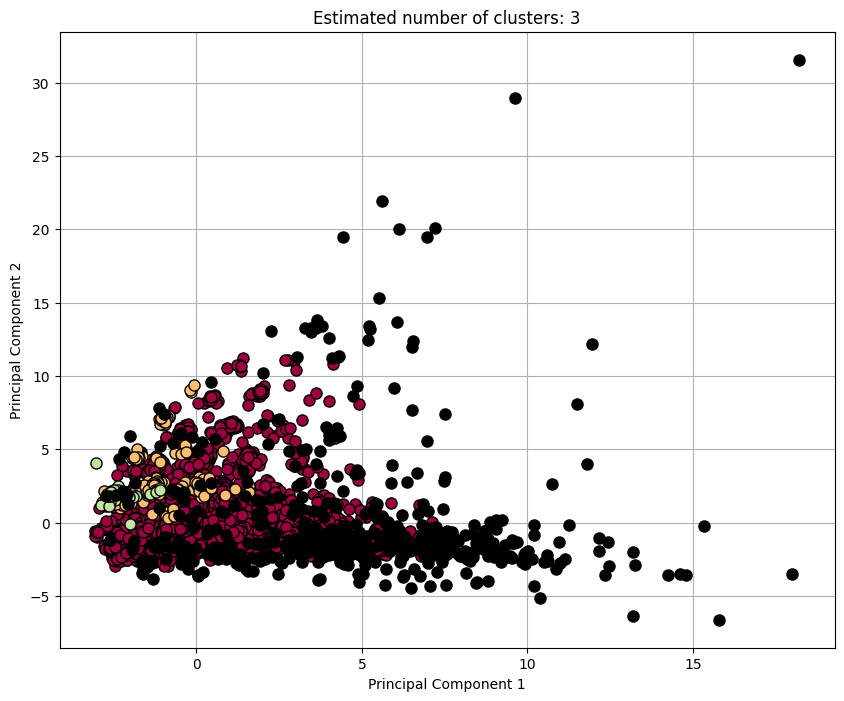

In [54]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1]  # black color for noise

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

Y luego, sin él.

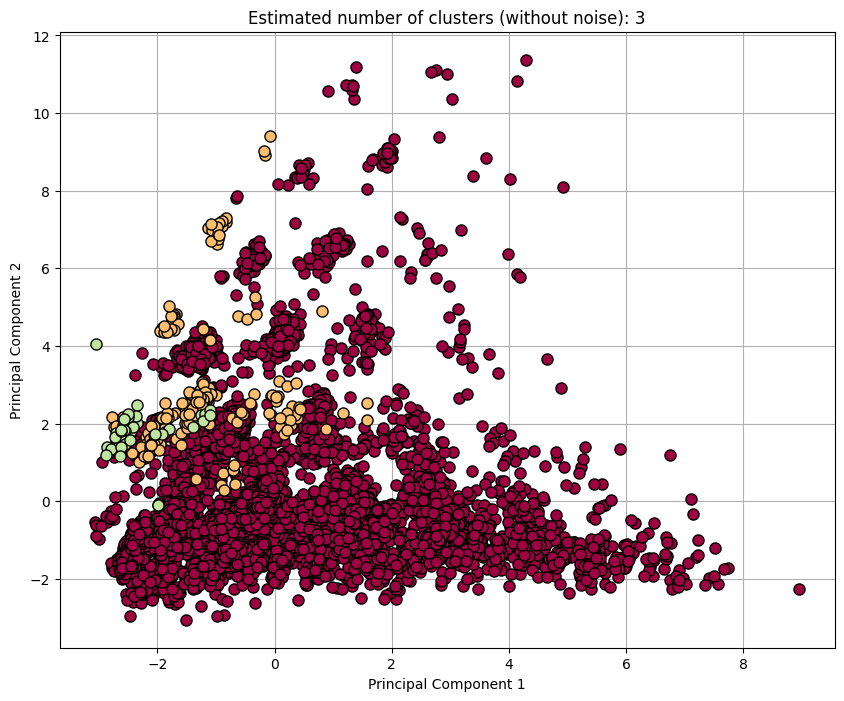

In [55]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [71]:
analyse_results()

Silhouette Coefficient: 0.231
Calinski-Harabasz Index: 351.893
Davies-Bouldin Index: 2.092


Comentaremos los resultados al final de esta sección.

A continuación, seguimos los mismos pasos para el resto de los posibles épsilones.

### Epsilon = 5.5

In [72]:
db = DBSCAN(eps=5.5, min_samples=80).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 411


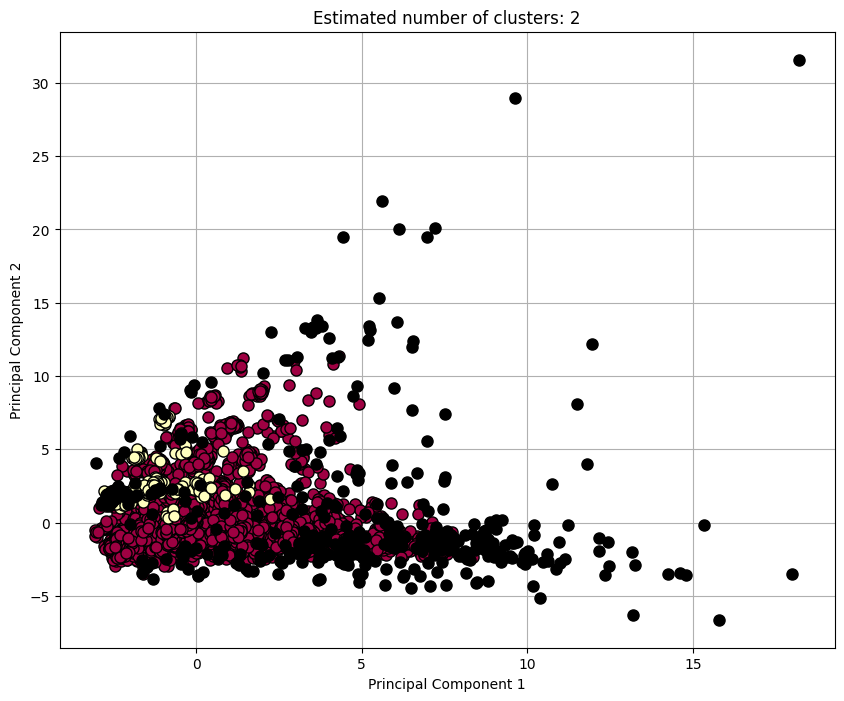

In [59]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1] 

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

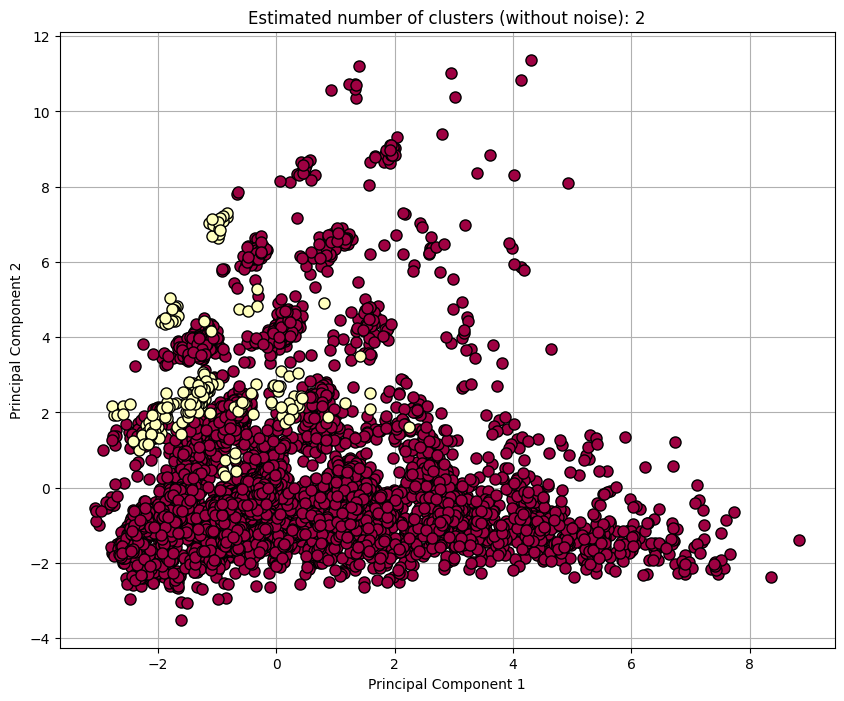

In [60]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [73]:
analyse_results()

Silhouette Coefficient: 0.226
Calinski-Harabasz Index: 374.994
Davies-Bouldin Index: 2.612


### Epsilon = 6

In [ ]:
db = DBSCAN(eps=6, min_samples=44).fit(normalized_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 179


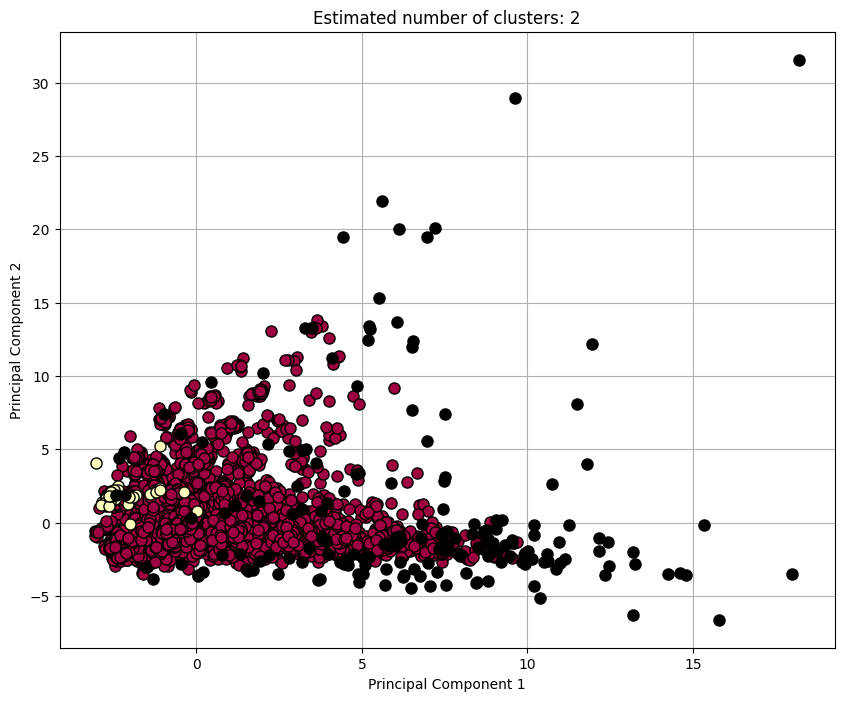

In [ ]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1]  

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

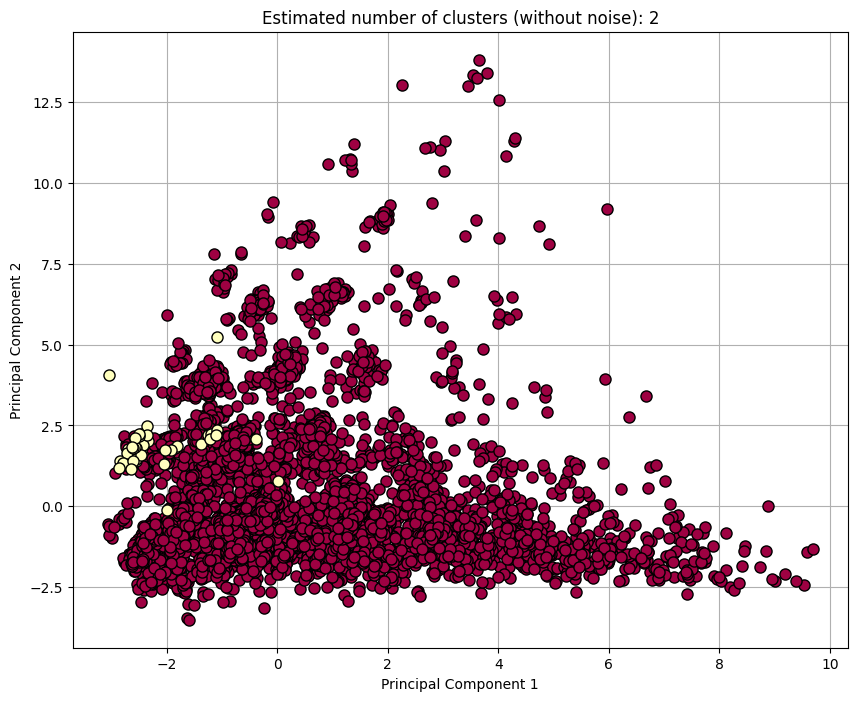

In [ ]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [15]:
analyse_results()

Silhouette Coefficient: 0.477
Calinski-Harabasz Index: 310.894
Davies-Bouldin Index: 1.986


### Epsilon = 6.5

In [76]:
db = DBSCAN(eps=6.5, min_samples=24).fit(normalized_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 106


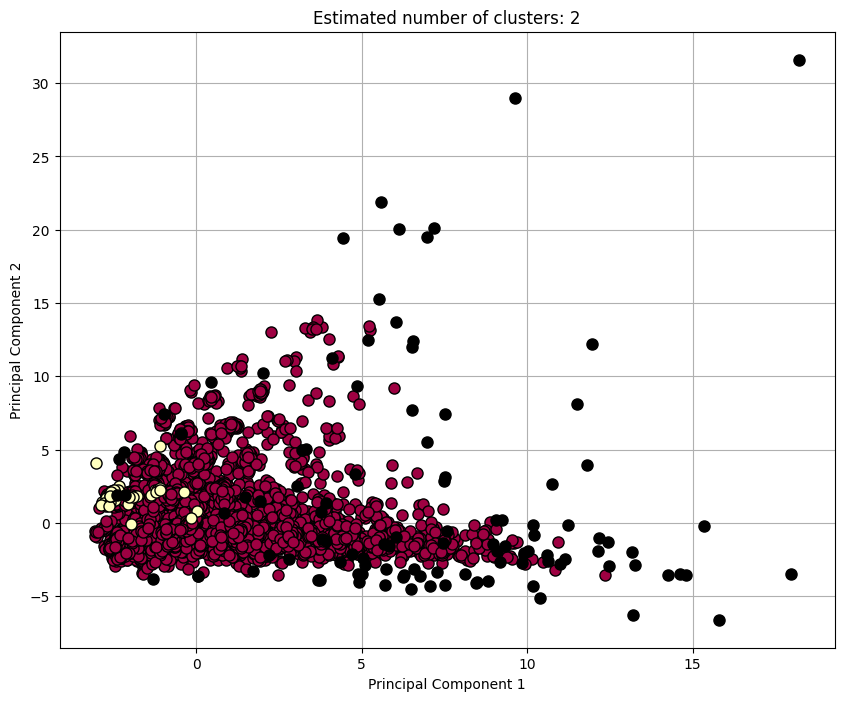

In [66]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1] 

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

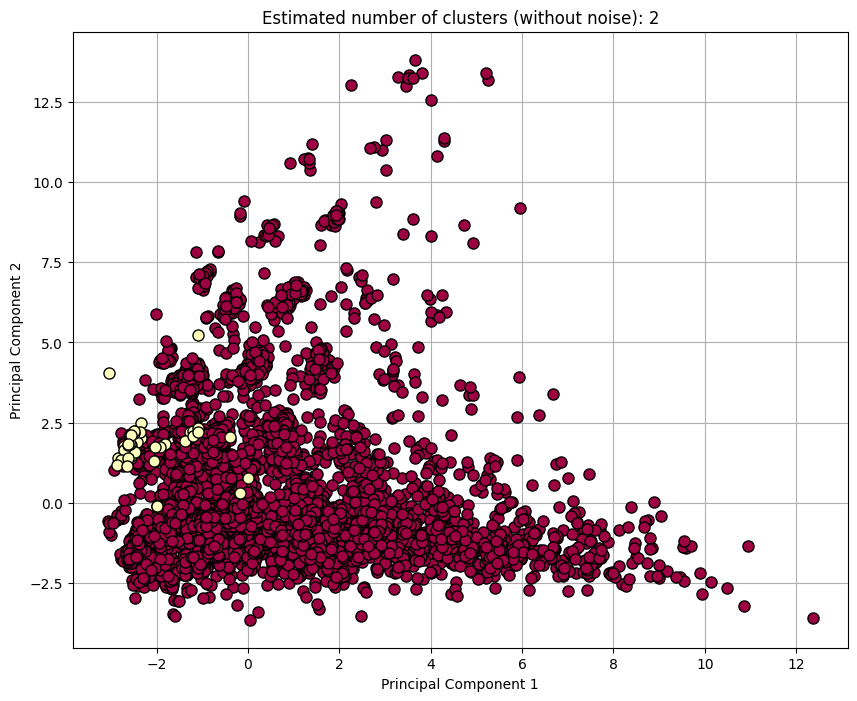

In [67]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [77]:
analyse_results()

Silhouette Coefficient: 0.477
Calinski-Harabasz Index: 275.341
Davies-Bouldin Index: 1.980


### Epsilon = 7

In [ ]:
db = DBSCAN(eps=7, min_samples=35).fit(normalized_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 77


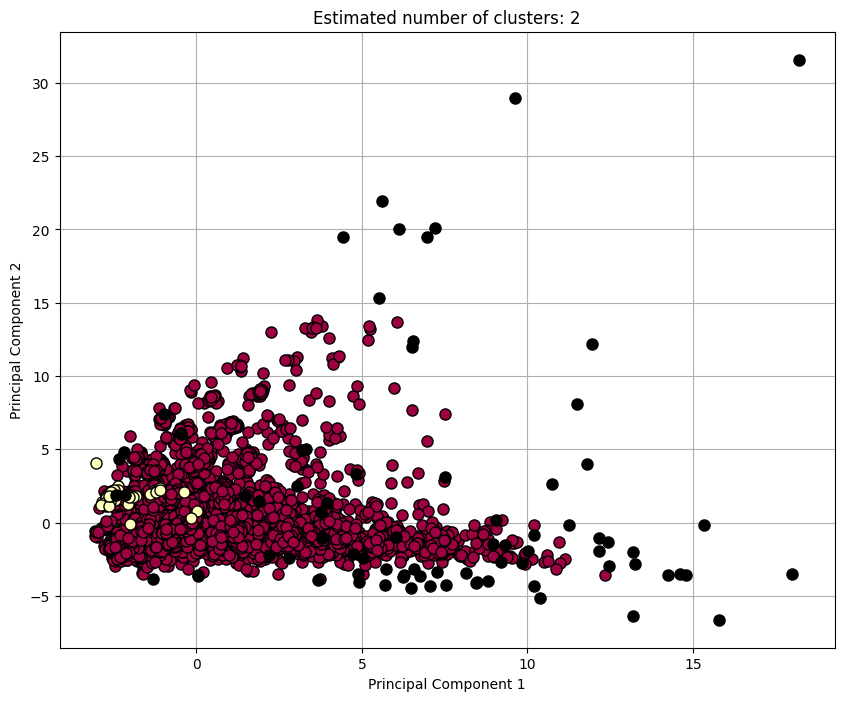

In [7]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1] 

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

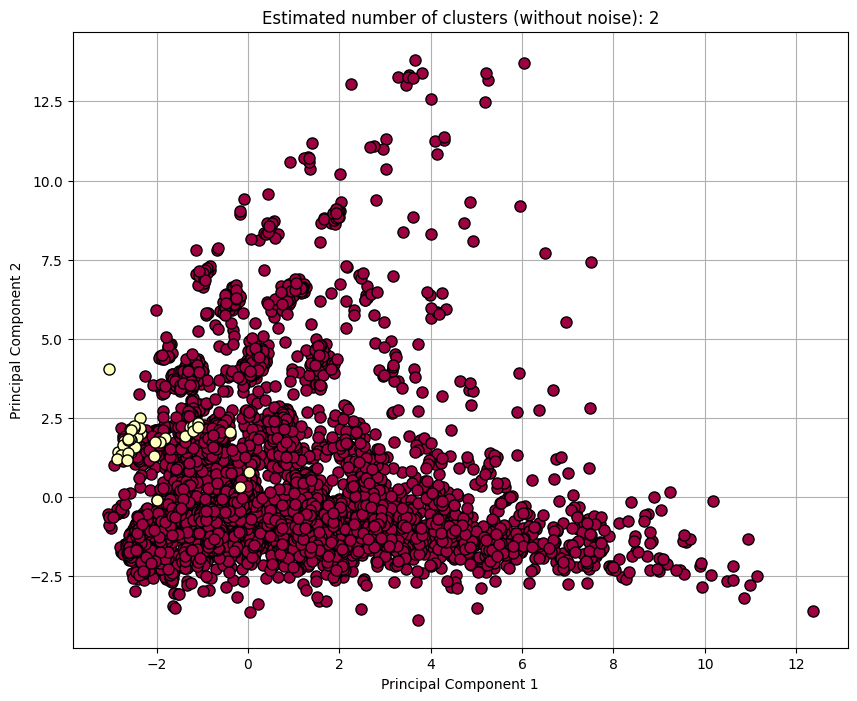

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [9]:
analyse_results()

Silhouette Coefficient: 0.477
Calinski-Harabasz Index: 248.804
Davies-Bouldin Index: 2.035


### Epsilon = 7.5

In [18]:
db = DBSCAN(eps=7.5, min_samples=46).fit(normalized_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 55


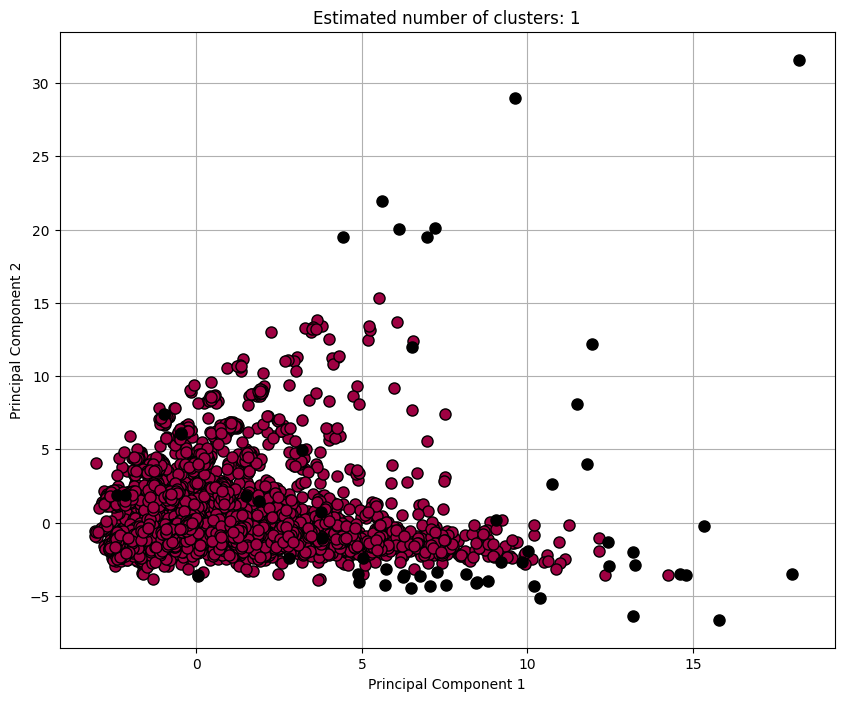

In [19]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1]  

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

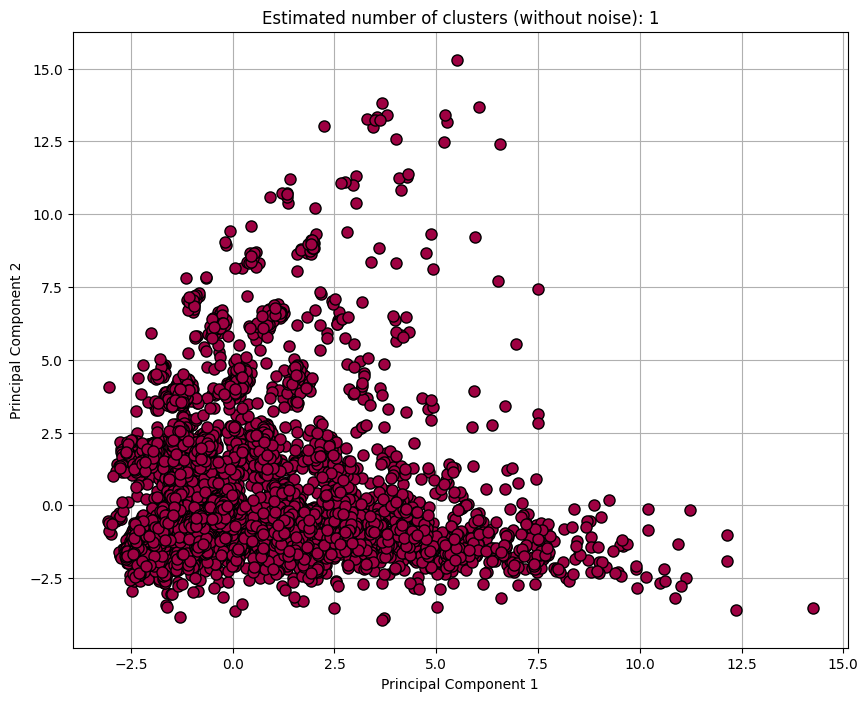

In [20]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [21]:
analyse_results()

Silhouette Coefficient: 0.680
Calinski-Harabasz Index: 220.695
Davies-Bouldin Index: 2.224


### Conclusión

The results were as following:

---

#### Epsilon = 5
Estimated number of clusters: 3  
Estimated number of noise points: 485  
Silhouette Coefficient: 0.231  
Calinski-Harabasz Index: 351.893  
Davies-Bouldin Index: 2.092  

En ese caso tenemos 3 clústeres, lo que podría parecer interesante, pero:
- El coeficiente de Silhouette es solo 0.231, lo que sugiere una separación deficiente de los clústeres.
- El DBI es 2.092, indicando una calidad de clústeres inferior a otras configuraciones.
- La cantidad de puntos ruido es la más alta (485).

#### Epsilon = 5.5
Estimated number of clusters: 2  
Estimated number of noise points: 411  
Silhouette Coefficient: 0.226  
Calinski-Harabasz Index: 374.994  
Davies-Bouldin Index: 2.612  

- El coeficiente de Silhouette es bajo (0.226), lo que indica que los clústeres están menos definidos en comparación con eps = 6 o eps = 6.5.
- El DBI es el más alto (2.612), lo que indica una calidad de clústeres inferior.
- La cantidad de puntos de ruido sigue siendo alta (411).


#### Epsilon = 6
Estimated number of clusters: 2  
Estimated number of noise points: 179  
Silhouette Coefficient: 0.477  
Calinski-Harabasz Index: 310.894  
Davies-Bouldin Index: 1.986  

- El DBI es 1.986, ligeramente más alto que el de eps = 6.5 (1.980).
- La cantidad de puntos ruido es mayor (179) que con eps = 6.5.

#### Epsilon = 6.5
Estimated number of clusters: 2  
Estimated number of noise points: 106  
Silhouette Coefficient: 0.477  
Calinski-Harabasz Index: 275.341  
Davies-Bouldin Index: 1.980  

La mejor opción.

#### Epsilon = 7
Estimated number of clusters: 2  
Estimated number of noise points: 77  
Silhouette Coefficient: 0.477  
Calinski-Harabasz Index: 248.804  
Davies-Bouldin Index: 2.035  

- El DBI aumenta a 2.035, lo que sugiere una disminución en la calidad de los clústeres en comparación con eps = 6.5.
- La cantidad de puntos ruido es menor (77), pero a costa de un DBI y CH peores.

#### Epsilon = 7.5
Estimated number of clusters: 1  
Estimated number of noise points: 55  
Silhouette Coefficient: 0.680  
Calinski-Harabasz Index: 220.695  
Davies-Bouldin Index: 2.224  

- Solo 1 clúster, lo que significa que no hay una división útil. 
- Esta opción no es útil para analizar la estructura de los datos proporcionados.

---

A la hora de elegir los mejores resultados, deberíamos maximizar la puntuación Silhouette y la puntuación Calinski-Harabasz, y minimizar el índice Davies-Bouldin.

Para eps = 6, eps = 6.5 y eps = 7, el valor de Silhouette es 0.477, que es significativamente más alto en comparación con otras configuraciones, lo que indica que los clústeres están mejor definidos y claramente separados.

El valor más bajo de DBI=1.980 se obtuvo con eps = 6.5. Ese índice mide la calidad de los clústeres, entonces se puede decir que la configuración col el eps = 6.5 nos da los mejores resultados.

En caso de índice de Calinski-Harabasz, el valor más alto se obtuvo para el eps = 5.5. Sin embargo, para ese valor de epsilon, los valores de otros índices no son tan buenos.

Para eps = 6.5, el valor de CH es 275.341, lo que sigue siendo aceptable y está equilibrado con otros indicadores. También, la cantidad de puntos etiquetados como ruido disminuye a 106. 

**Al final, pensamos que es mejor usar el DBSCAN con eps = 6.5.**, porque:

Maximiza el coeficiente de Silhouette (0.477).
Minimiza el índice de Davies-Bouldin (1.980).
La cantidad de puntos de ruido (106) es aceptable, y los clústeres están claramente definidos.
Por lo tanto, elegir eps = 6.5 proporciona el mejor equilibrio entre calidad, separación de los clústeres y cantidad de puntos de ruido.

## Tarea 4.5

¿Cuál es el número óptimo de clusters? ¿por qué?

Basándonos en los resultados anteriores, los datos deberían dividirse en **2 clústeres** con eps = 6.5 y min_samples = 24.

Conseguimos esta conclusión después de analizar varias opciones. En caso de casi todos de varios epsilons, el número óptimo de clusters es 2. Eso significa, que en DBSCAN, como los algoritmos de apartados anteriores, divide los datos proporcionados en dos grupos visibles.

**Presentamos los resultados finales.**

In [ ]:
db = DBSCAN(eps=6.5, min_samples=24).fit(normalized_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 106


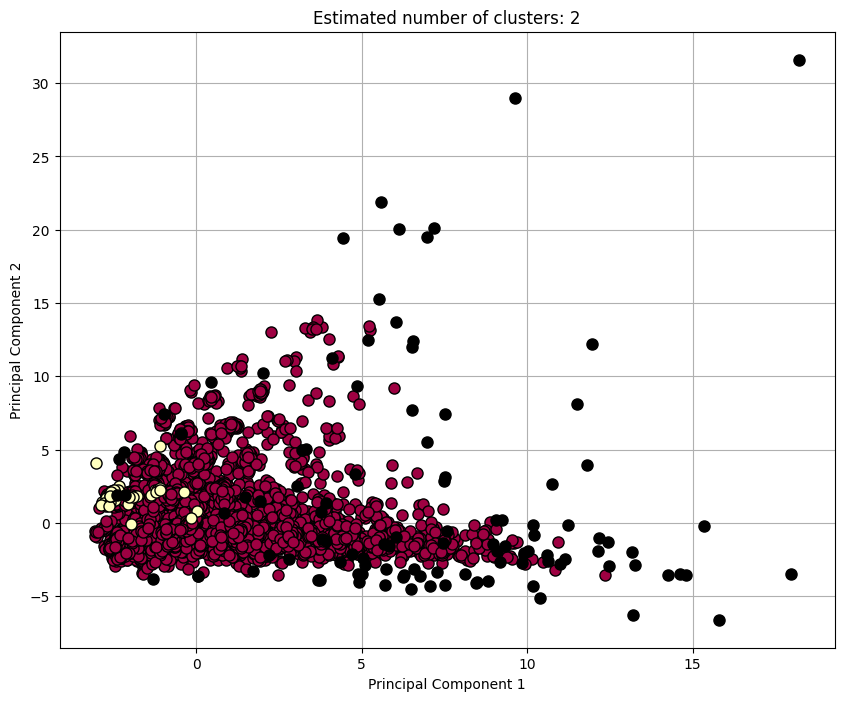

In [ ]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0, 0, 0, 1] 

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

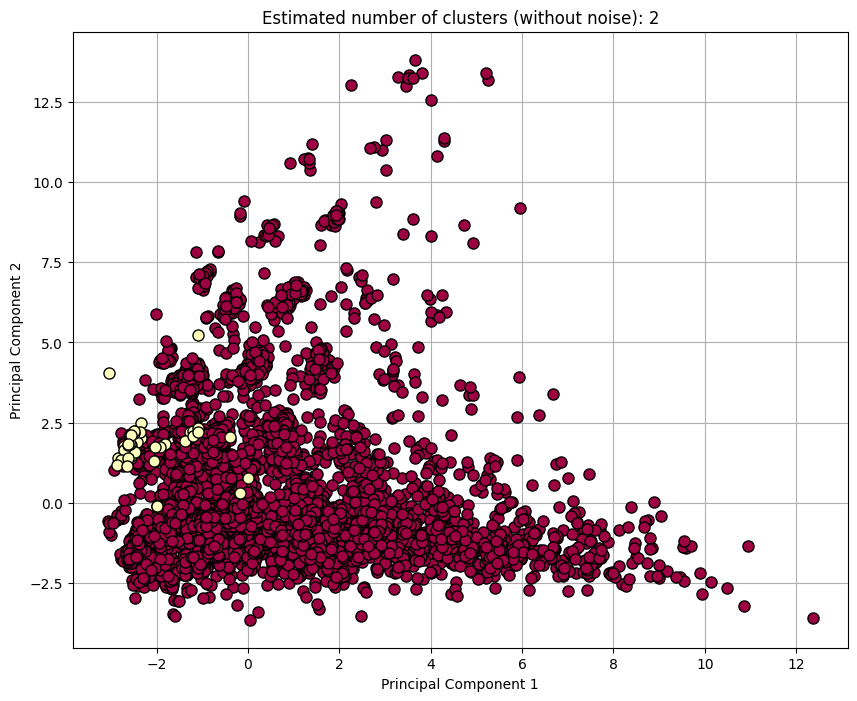

In [ ]:
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  
    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

In [ ]:
analyse_results()

Silhouette Coefficient: 0.477
Calinski-Harabasz Index: 275.341
Davies-Bouldin Index: 1.980
